# Calculating Copper - Jack Maughan

The ExploreSA Gawler Challenge was designed to find and apply new approaches to mineral exploration, using state geology and geophysics data.  The following notebook is a part of the series, __'Calculating Copper'__ and contains my thinking, processing and results for the challenge, with a idea of recreating a reproducible workflow for similar mineral exploration problems. 

![Title](https://docs.google.com/uc?export=download&id=1goFsreNqBipsuyFEOwi6cGgrpWwARCEt)

#### 1. Geology Forever - Background Information
#### 2. Hair and Makeup - Target Variable and Features
#### 3. Suit up - Compiling Dataframe and Feature Statistics
#### 4. My Friend Robot - Machine Learning Model Creation
#### 5. Gold Rush - Model Validation and Results
### *6. Extra Extra - Unsupervised Learning CoDa on Soil Geochemistry*

Wrapping up the Calculating Copper series, __Extra Extra__ looks at how to deal with compositional data in machine learning using a calcrete sampling survey dataset taken in the McDouall Peak area approximately 100km south-southeast of Coober Pedy. As geochemistry data is in a compositional form (each %, ppm or ppb value is a part of a whole) any statistical analysis must be performed with care due to the unique nature of the element relationships. We will look at how unsupervised learning performs on a raw geochemical dataset compared to a log transformed dataset and explore the importances of understanding compositional data analysis in geochemistry.

![Title](https://docs.google.com/uc?export=download&id=1zfVrS2eqZo51Df3xRFNg8rM3rmzIUkCe)

The geochemical data comes from a calcrete sampling program completed in 2009 by Quasar Resources. With this data we will perform unsupervised learning (or clustering) to group individual samples by their multi-element chemistry. We will focus especially on the areas that have high mineralisation probability given from the K Nearest Neighbour model. The first step is to load in the necessary libraries and the data.

### Data Preparation

In [1]:
#Load in the python libraries
import pandas as pd
from pyrolite.comp.codata import renormalise, ilr, clr, alr, logratiomean
import seaborn as sns
from scipy.cluster.vq import kmeans, vq
import matplotlib.pyplot as plt
from ipywidgets import interact, interact_manual
import plotly.express as px
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from pyrolite.plot import pyroplot
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

sns.set(rc={'figure.figsize':(15, 12)})
pd.options.display.max_columns = None

In [2]:
#Read in the data (previously subset from SARIG data)
df = pd.read_csv('Calcrete_Geochem.csv')

df

,SAMPLE_NO,SAMPLE_SOURCE_CODE,SAMPLE_SOURCE,ROCK_GROUP_CODE,ROCK_GROUP,LITHO_CODE,LITHO_CONF,LITHOLOGY_NAME,LITHO_MODIFIER,MAP_SYMBOL,STRAT_CONF,STRAT_NAME,COLLECTED_BY,COLLECTORS_NUMBER,COLLECTED_DATE,DRILLHOLE_NUMBER,DH_NAME,DH_DEPTH_FROM,DH_DEPTH_TO,SITE_NO,EASTING_GDA2020,NORTHING_GDA2020,ZONE_GDA2020,LONGITUDE_GDA2020,LATITUDE_GDA2020,LONGITUDE_GDA94,LATITUDE_GDA94,SAMPLE_ANALYSIS_NO,OTHER_ANALYSIS_ID,ANALYSIS_TYPE_DESC,LABORATORY,CHEM_CODE,VALUE,UNIT,CHEM_METHOD_CODE,CHEM_METHOD_DESC
0,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Ag,0.19,ppm,ME-MS62,Whole rock near total four acid digest with IC...
1,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",As,6.70,ppm,ME-MS62,Whole rock near total four acid digest with IC...
2,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Bi,0.24,ppm,ME-MS62,Whole rock near total four acid digest with IC...
3,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Ce,55.70,ppm,ME-MS62,Whole rock near total four acid digest with IC...
4,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Cu,27.80,ppm,ME-MS62,Whole rock near total four acid digest with IC...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142771,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Fe,0.57,%,ME-ICP61,Four acid near total digestion with ICP-MS fin...
142772,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",K,0.18,%,ME-ICP61,Four acid near total digestion with ICP-MS fin...
142773,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Mg,1.21,%,ME-ICP61,Four acid near total digestion with ICP-MS fin...
142774,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Mn,57.00,ppm,ME-ICP61,Four acid near total digestion with ICP-MS fin...


Now that the data is loaded into the notebook, we can assess what elements were assayed for these samples. Note that we are making the assumption that QAQC has been completed for this dataset and that using different analytical techniques for the elements won't cause any bias in the data.

In [3]:
#Viewing all the assayed elements
df['CHEM_CODE'].value_counts()

K     7932
La    7932
Ce    7932
As    7932
Cu    7932
Au    7932
Zn    7932
Bi    7932
Pb    7932
Th    7932
Mn    7932
Fe    7932
Mg    7932
Ca    7932
Ga    7932
U     7932
Al    7932
Ag    7932
Name: CHEM_CODE, dtype: int64

Here we can see all the elements that our 7932 samples were assayed for and thankfully none of them are missing data or contain any below detection limit data (very good so far).

In [4]:
#Viewing the unit types
df['UNIT'].value_counts()

ppm    103116
%       39660
Name: UNIT, dtype: int64

We can also see here that the data is in different units (% or ppm). For our distance based data analysis we must make sure all these elements have consistent units. For this we will convert all the ppm units into % to make it easily understandable.

In [5]:
#Setting the column data type to float
df['VALUE'] = df['VALUE'].astype('float64')

#Converting ppm units to %
df.loc[df['UNIT'] == 'ppm', 'VALUE'] = df.loc[df['UNIT'] == 'ppm', 'VALUE'] / 10000

df

,SAMPLE_NO,SAMPLE_SOURCE_CODE,SAMPLE_SOURCE,ROCK_GROUP_CODE,ROCK_GROUP,LITHO_CODE,LITHO_CONF,LITHOLOGY_NAME,LITHO_MODIFIER,MAP_SYMBOL,STRAT_CONF,STRAT_NAME,COLLECTED_BY,COLLECTORS_NUMBER,COLLECTED_DATE,DRILLHOLE_NUMBER,DH_NAME,DH_DEPTH_FROM,DH_DEPTH_TO,SITE_NO,EASTING_GDA2020,NORTHING_GDA2020,ZONE_GDA2020,LONGITUDE_GDA2020,LATITUDE_GDA2020,LONGITUDE_GDA94,LATITUDE_GDA94,SAMPLE_ANALYSIS_NO,OTHER_ANALYSIS_ID,ANALYSIS_TYPE_DESC,LABORATORY,CHEM_CODE,VALUE,UNIT,CHEM_METHOD_CODE,CHEM_METHOD_DESC
0,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Ag,0.000019,ppm,ME-MS62,Whole rock near total four acid digest with IC...
1,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",As,0.000670,ppm,ME-MS62,Whole rock near total four acid digest with IC...
2,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Bi,0.000024,ppm,ME-MS62,Whole rock near total four acid digest with IC...
3,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Ce,0.005570,ppm,ME-MS62,Whole rock near total four acid digest with IC...
4,2438832,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,47075,20/10/09,NaN,NaN,NaN,NaN,2064844,518400.74,6708801.56,53,135.190311,-29.750897,135.190301,-29.750883,1969518,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Cu,0.002780,ppm,ME-MS62,Whole rock near total four acid digest with IC...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142771,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Fe,0.570000,%,ME-ICP61,Four acid near total digestion with ICP-MS fin...
142772,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",K,0.180000,%,ME-ICP61,Four acid near total digestion with ICP-MS fin...
142773,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Mg,1.210000,%,ME-ICP61,Four acid near total digestion with ICP-MS fin...
142774,2440304,CALC,Calcrete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,QUASAR RESOURCES PTY LTD.,49553,20/10/09,NaN,NaN,NaN,NaN,2066316,528800.76,6683201.47,53,135.298560,-29.981731,135.298550,-29.981717,1970990,NaN,GEOCHEMISTRY,"ALS Chemex, Adelaide SA",Mn,0.005700,ppm,ME-ICP61,Four acid near total digestion with ICP-MS fin...


Here we can see that even though the units still say ppm in the table, the actual values are in % units. From here we can pivot the table so that each column reflects individual elements, as was done in __Hair and Makeup__.

In [6]:
#Pivoting table
df_p = pd.pivot_table(df, index=['SAMPLE_NO', 'CHEM_METHOD_CODE', 'COLLECTED_BY', 'EASTING_GDA2020',
                                 'NORTHING_GDA2020'], columns='CHEM_CODE', values='VALUE')

#Resetting the index
df_p = df_p.rename_axis(None, axis=1).reset_index()

#Grouping the data so various assay methods line up on the same sample
df_p = df_p.groupby(['SAMPLE_NO', 'EASTING_GDA2020','NORTHING_GDA2020'])['Ag', 'Al', 'As', 'Au', 
                                 'Bi','Ca', 'Ce', 'Cu',
                                 'Fe','Ga','K' ,'La', 'Mg',
                                 'Mn', 'Pb','Th', 'U', 'Zn'].sum().reset_index()

df_p 

,SAMPLE_NO,EASTING_GDA2020,NORTHING_GDA2020,Ag,Al,As,Au,Bi,Ca,Ce,Cu,Fe,Ga,K,La,Mg,Mn,Pb,Th,U,Zn
0,2438832,518400.74,6708801.56,0.000019,7.27,0.00067,4.000000e-08,0.000024,0.53,0.005570,0.00278,3.98,0.001915,0.92,0.00290,1.04,0.0434,0.00191,0.00088,0.00013,0.0074
1,2438833,508400.77,6708001.48,0.000012,3.36,0.00040,2.100000e-07,0.000012,8.53,0.002570,0.00252,1.79,0.000801,0.53,0.00143,1.96,0.0136,0.00075,0.00043,0.00012,0.0030
2,2438834,520400.82,6708001.51,0.000019,6.18,0.00121,7.000000e-08,0.000024,0.49,0.005020,0.00279,4.07,0.001610,0.80,0.00234,0.97,0.0364,0.00152,0.00077,0.00016,0.0064
3,2438835,532400.80,6708001.49,0.000023,4.97,0.00042,5.000000e-09,0.000020,0.26,0.003430,0.00168,2.86,0.001305,0.66,0.00175,0.37,0.0201,0.00133,0.00073,0.00011,0.0033
4,2438836,522400.81,6707201.54,0.000017,9.54,0.00074,1.000000e-08,0.000021,0.48,0.005150,0.00125,2.54,0.001740,0.54,0.00266,0.20,0.0061,0.00096,0.00057,0.00015,0.0006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1468,2440300,528800.82,6684001.51,0.000010,2.62,0.00053,8.000000e-08,0.000010,20.60,0.001940,0.00193,1.62,0.000893,0.36,0.00153,0.53,0.0113,0.00055,0.00031,0.00010,0.0044
1469,2440301,527600.81,6683201.54,0.000021,2.71,0.00187,9.000000e-08,0.000018,9.10,0.001440,0.00161,2.30,0.001000,0.31,0.00085,0.36,0.0056,0.00054,0.00054,0.00013,0.0034
1470,2440302,528000.76,6683201.53,0.000021,4.14,0.00070,2.600000e-07,0.000013,5.52,0.000897,0.00161,0.57,0.000957,0.30,0.00051,0.83,0.0045,0.00030,0.00031,0.00013,0.0028
1471,2440303,528400.81,6683201.51,0.000020,1.79,0.00070,3.100000e-07,0.000027,10.85,0.001355,0.00177,2.06,0.000857,0.29,0.00082,0.51,0.0093,0.00058,0.00035,0.00020,0.0034


As our geochemistry data is in a weight percentage of each sample, it is considered to be [compositional data](https://en.wikipedia.org/wiki/Compositional_data). This means that we must treat it differently in regards to our traditional statistical analysis methods. In the next step we will calculate the total % assayed for each sample.

In [7]:
#Calculating the total percentage of assayed elements
df_p['Total %'] = (df_p[['Ag', 'Al', 'As', 'Au', 
                         'Bi','Ca', 'Ce', 'Cu',
                         'Fe','Ga','K' ,'La', 'Mg',
                         'Mn', 'Pb','Th', 'U', 'Zn']].sum(axis=1))

#Viewing the total statistics
df_p['Total %'].describe()

count    1473.000000
mean       15.297426
std         4.686133
min         2.959805
25%        12.578332
50%        14.987860
75%        18.347015
max        31.900923
Name: Total %, dtype: float64

We can see that the mean sum of weight percentage for the assayed elements is ~15%. That means that on average there is about 85% of each sample that contains unassayed elements (this makes sense as elements such as silicon and the oxygen component of oxides are not included in this dataset). We must keep this in mind as each elemental abundance is relative to the remaining sample, and not an absolute value. In the next cell we will subset a dataframe that contains the elemental values and drop Cerium as it appears to be dirty data. 

In [8]:
#Just selecting the elements
ele = df_p[['Ag', 'Al', 'As', 'Au', 
            'Bi','Ca', 'Ce', 'Cu',
            'Fe','Ga','K' ,'La', 'Mg',
            'Mn', 'Pb','Th', 'U', 'Zn']]

#Dropping Cerium 
ele = ele.drop(['Ce'], axis=1)

### K-Means Clustering on Raw Data

Now that we have the data in the format we want, we can look at doing some unsupervised learning on it. Firstly we will plot the scatter plots for each element and gain an idea of how each of our data is distributed.

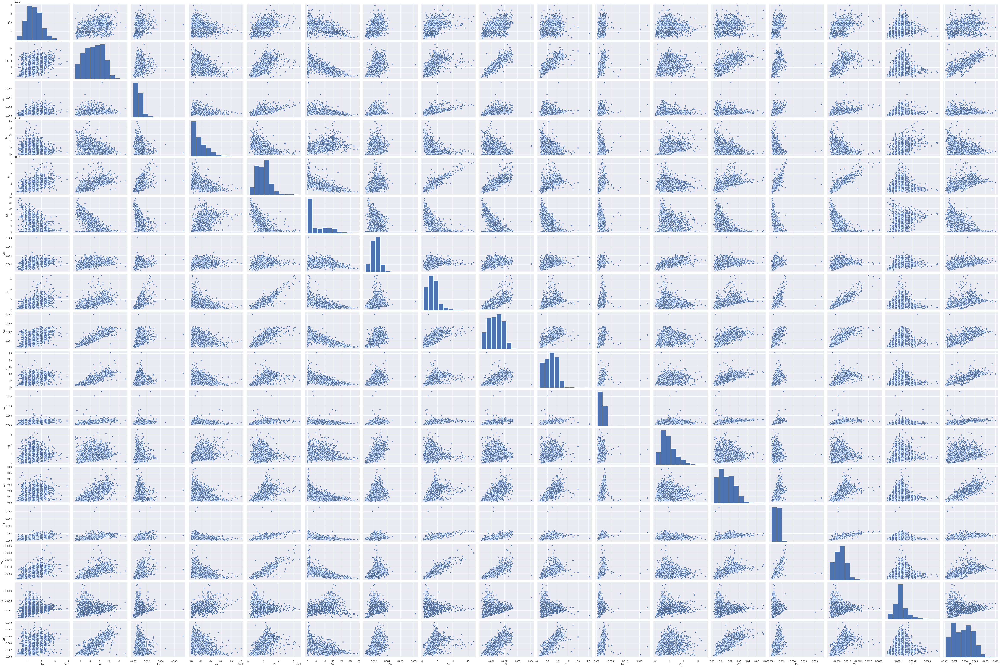

In [9]:
#Plotting pair plots of every element
sns.pairplot(ele, aspect=1.5)
plt.show()

As expected with geochemical data, the majority of elements are distributed in a lognormal fashion. This is due to the compoisitional nature of our data, where when one element increases the other must decrease to suit the bounds of our 100% composition. The data is currently in a simplex space, which means it is bound by our compositional constraint (100% in this case). We can view this type of data in a simplex plot, or more commonly known in geochemistry as a ternary diagram. For this we will use Geochemistry python package, [Pyrolite](https://github.com/morganjwilliams/pyrolite).

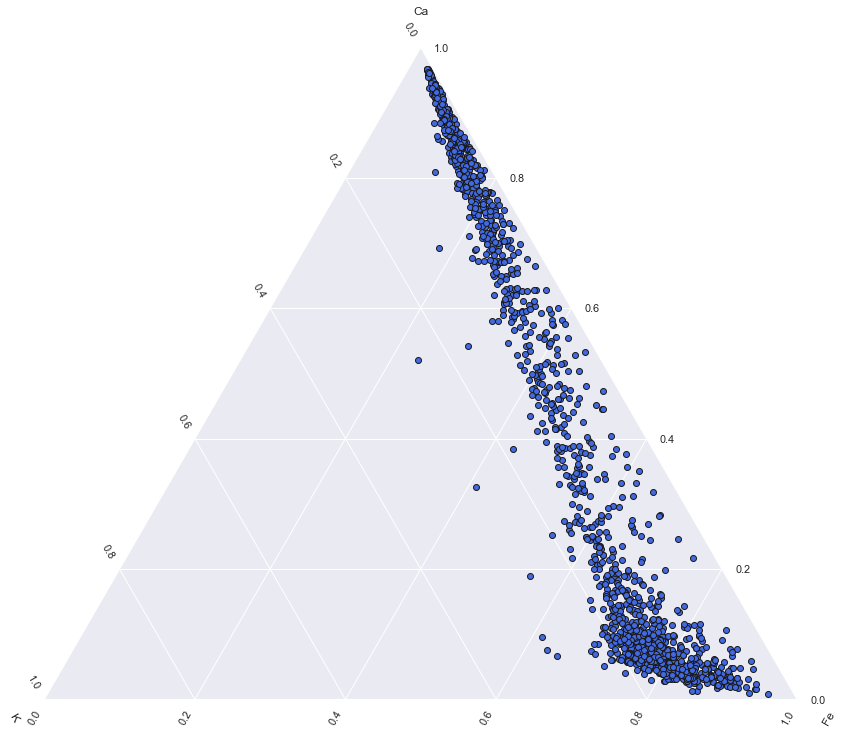

In [10]:
#Plotting the ternary diagram
ax = ele.loc[:, ["Ca", "K", "Fe"]].pyroplot.scatter(c="royalblue", edgecolors='k', norm=True)
plt.show()

There is a somewhat linear relationship between the elements up until about 75% Fe content where they converge towards a higher Fe content. We can also view this data in a 3-Dimensional Euclidean Space and see how it compares.

In [11]:
#Plotting the 3D relationships in a euclidean space
fig = px.scatter_3d(ele, x='Ca', y='K', z='Fe')
fig.update_traces(marker=dict(size=8, line=dict(width=2, color='DarkSlateGrey')), 
                  selector=dict(mode='markers'))
fig.show()

Here we can see that the relationships are a bit harder to understand, and every axis appears to be a lognormal representation of the elements. Before we do anything to the data, we will perform some K-Means clustering and see how it goes. Note that K-means clustering is dependent on the distances between samples in a euclidean space, so is not designed to handle our compositional data. 

We will perform multivariate K-Means clustering on all our our elements. To start our K-Means clustering, we will assess the optimal number of clusters (k) our data contains by plotting the elbow plot. More information on K-Means clustering can be found [here](https://medium.com/analytics-vidhya/how-to-determine-the-optimal-k-for-k-means-708505d204eb).

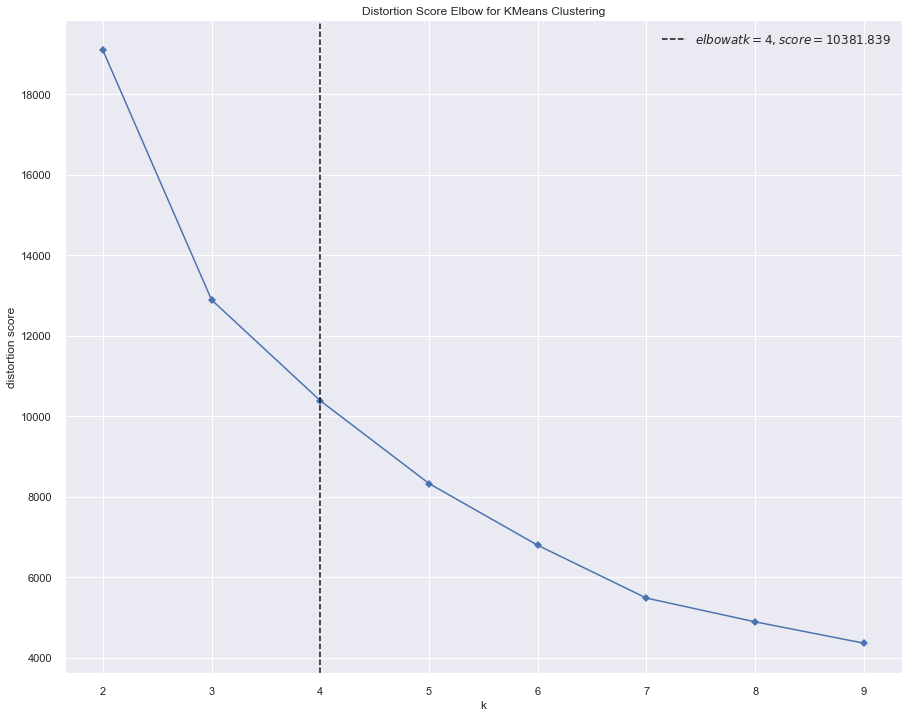

In [12]:
#Create a KMeans model
model = KMeans(random_state=0)

#Create a elbow plot with 2-10 clusters  
visualizer = KElbowVisualizer(model, k=(2,10), metric='distortion', timings=False)

#Fit the data and visualize
visualizer.fit(ele)    
visualizer.poof()   

Here we can see that the optimal number of clusters for K-means clustering is 4 for this dataset. We can also view the average silhouette score and silhouette plots for each cluster below.

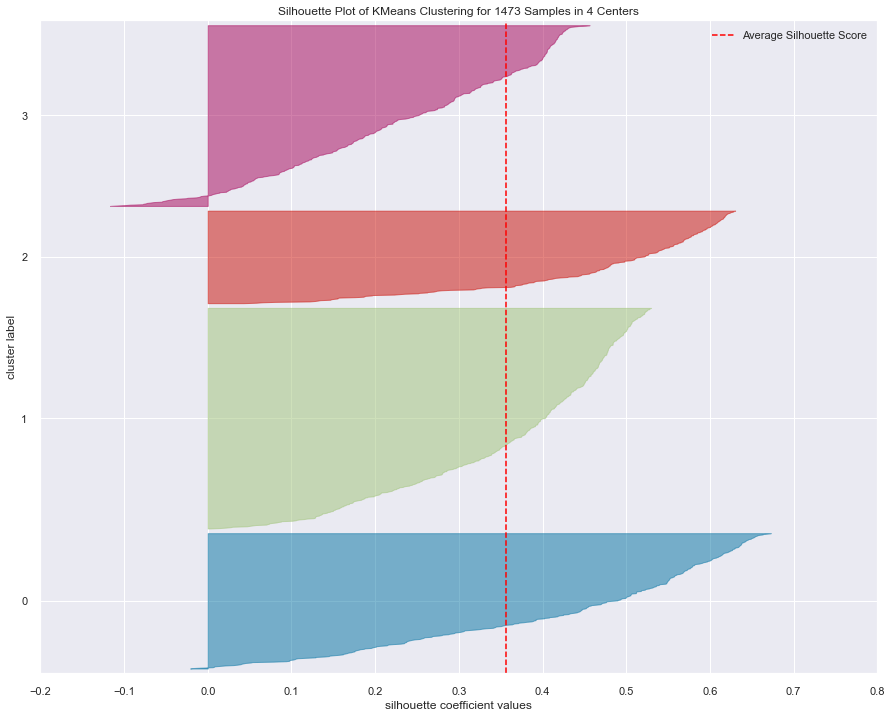

In [13]:
model = KMeans(4, random_state=0)

visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(ele) 
visualizer.show()  

Above we can see the silhouette scores for each cluster, which effectively means how similar each sample point is to the remaining cluster. The average silhouette score is approximately 0.35. We will use this metric to compare to our transformed data later down the track, but for now we can assign each cluster label to our data and visualise how well our samples are clustered

In [14]:
#Adding the cluster labels to our dataframes
df_p['k_cluster_labels'] = model.labels_
ele['k_cluster_labels'] = model.labels_

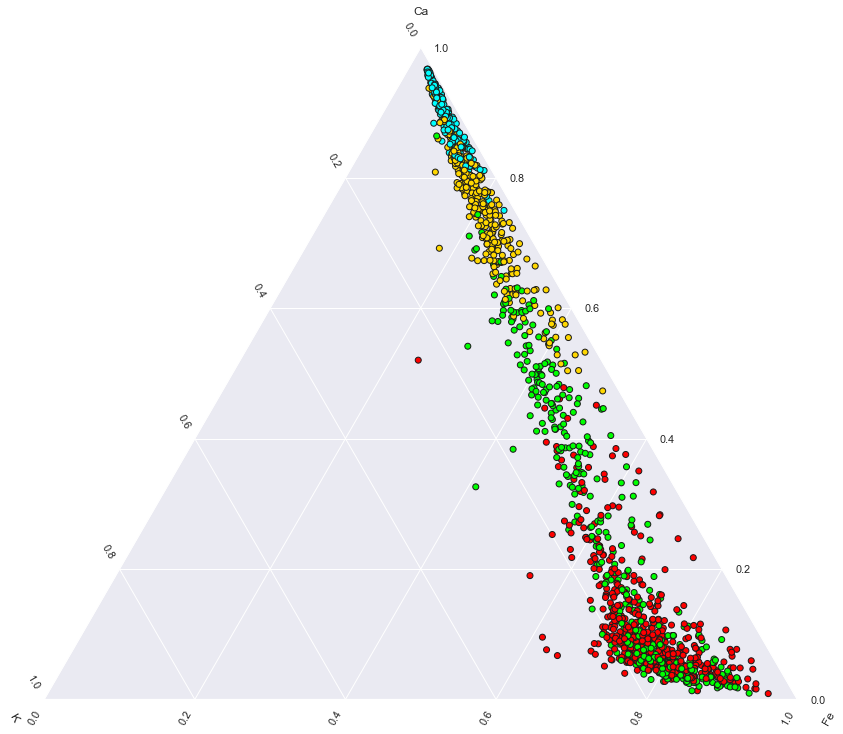

In [15]:
#Adding a colour dictionary
colors = {0: 'gold', 1:'red', 2:'cyan', 3:'lime'}

#Plotting the same ternary diagram with colours
ax = df_p.loc[:, ["Ca", "K", "Fe"]].pyroplot.scatter(c=df_p['k_cluster_labels'].apply(lambda x: colors[x]), edgecolors='k')
plt.show()

The clusters have grouped together quite nicely, with the high Ca samples having a high density cluster. The two Fe rich groups have some significant overlap but overall the clustering has not performed to badly. For more information on the clusters we can view the average elemental composition of each one. 

In [16]:
#Viewing the average elemental value of each cluster
ele.groupby(['k_cluster_labels']).mean()

,Ag,Al,As,Au,Bi,Ca,Cu,Fe,Ga,K,La,Mg,Mn,Pb,Th,U,Zn
k_cluster_labels,,,,,,,,,,,,,,,,,
0,0.000014,3.815426,0.000886,2.679495e-07,0.000016,9.777035,0.002393,2.633659,0.001074,0.504574,0.001553,1.129338,0.009979,0.000840,0.000513,0.000137,0.002454
1,0.000017,6.792849,0.000993,9.635659e-08,0.000028,0.828934,0.002489,5.229903,0.001872,0.938702,0.002377,0.964845,0.024255,0.001493,0.000945,0.000118,0.005496
2,0.000011,2.431290,0.000586,3.388940e-07,0.000010,16.767051,0.001917,1.562535,0.000649,0.331843,0.001182,0.805806,0.007297,0.000551,0.000341,0.000144,0.001688
3,0.000014,4.301962,0.000715,9.478723e-08,0.000019,1.674326,0.001948,3.180402,0.001190,0.628156,0.001682,0.758700,0.015583,0.001076,0.000624,0.000090,0.003275


Next we can can view the results on a map and see how well the clusters are grouped spatially. This step was done in QGIS by saving the current dataframe as a csv file and importing as points to QGIS.

![Title](https://docs.google.com/uc?export=download&id=1p5BpD5GEc9cKDrUw7mCZcLUN5bTaFXFE)

We can see here that the clusters group together quite nicely and show some correlation with the underlying GCAS radiometrics map. In particular, we can see that the higher thorium areas on the radiometrics map (green) show some correlation with cluster 1, which expectedly has the highest thorium content of the four clusters. These results may give us some indication of multi-element patterns across our calcrete sampling grid, but next we will see how applying some transforms to our data can improve our clustering.

### K Means Clustering on Transformed Data

Without going too deep into the theory of compositional data analysis, our aim is to convert our data from a simplex (as seen above) into a euclidean space to make our traditional statistical analysis methods more robust. To do this we use a log transform. There are three main transformations that we can do to our data; the Additive Log-Ratio (ALR), the Centered Log Ration (CLR) or the Isometric Log Ratio (ILR). More information on these transforms and how they are calculated can be found [here](http://www.sediment.uni-goettingen.de/staff/tolosana/extra/CoDaNutshell.pdf). Again using pyrolite, we will perform a CLR transform on our data and then plot it again in a euclidean space. We will also 'close' our dataset, so that now all our samples have a total weight sum of 100%.

In [17]:
#Resubsetting our elemental dataframe
ele = df_p[['Ag', 'Al', 'As', 'Au', 
            'Bi','Ca', 'Ce', 'Cu',
            'Fe','Ga','K' ,'La', 'Mg',
            'Mn', 'Pb','Th', 'U', 'Zn']]

#Dropping Cerium from the dataset
ele = ele.drop(['Ce'], axis=1)

#Renormalise so that each sample adds up to 100% (1000000 ppm) 
ele_close = renormalise(ele, scale=100)

#Taking the Centred Log Ratio of our data
ele_clr = clr(ele_close)

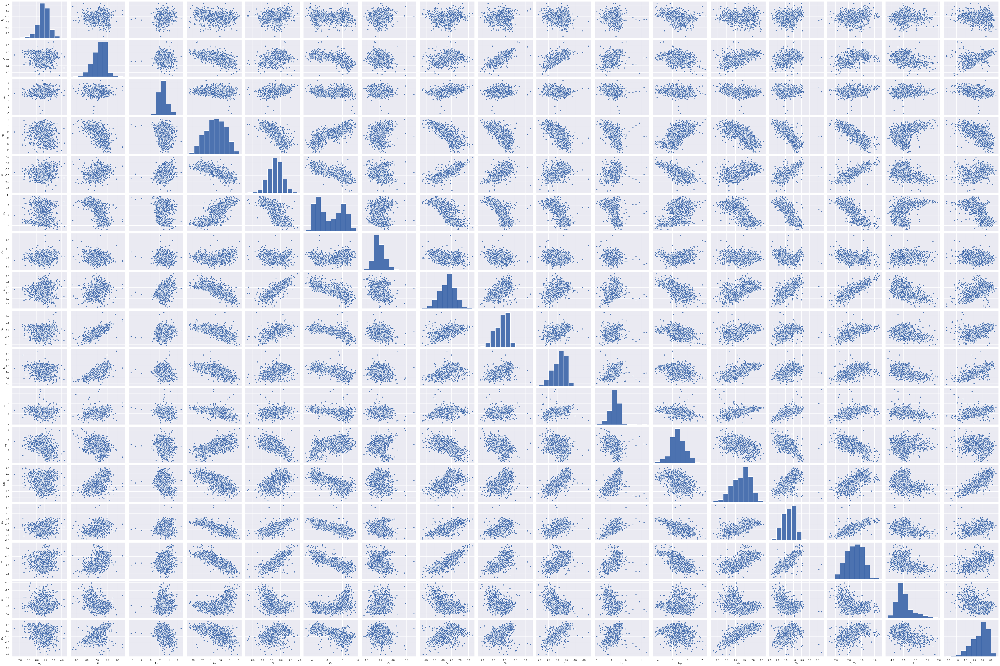

In [18]:
#Plotting pair plots of every element
sns.pairplot(ele_clr, aspect=1.5)
plt.show()

Now that we have performed a Centred Log Ratio transform on our data we can see that the elements are now distributed more normally (or close to). We can also see how the relationships between Ca, K and Fe look in a euclidean space.

In [19]:
#Plotting the same 3 elements in 3-Dimensional euclidean space
fig = px.scatter_3d(ele_clr, x='Ca', y='K', z='Fe')
fig.update_traces(marker=dict(size=8, line=dict(width=2, color='DarkSlateGrey')), 
                  selector=dict(mode='markers'))
fig.show()

With our transformed data, we can interpret the linear relationship seen in the ternary diagram in a 3 Dimensional euclidean space. This highlights how we should be careful handling compositional data with regards to performing traditional statistical methods.

#### Elemental Grouping 
Before doing any K-means clustering, we can look at how our elements are correlated in this dataset. Following a study by Dmitrijeva [(2020)](https://www.researchgate.net/publication/338500936_Multivariate_Statistical_Analysis_of_Trace_Elements_in_Pyrite_Prediction_Bias_and_Artefacts_in_Defining_Mineral_Signatures), we will look at creating a covariance matrix of our original element data and grouping our elements based on their similarity. One way to do this is use the package __Compositions__, however this is built from the statistical language __R__. Thankfully, with a little bit of magic we can use R in our python notebook.

In [20]:
%load_ext rpy2.ipython

In [21]:
%%R -i ele -w 5 -h 5 --units in -r 200
# import element data from global environment

#Installing and Importing the Compositions package
install.packages("compositions", repos='http://cran.us.r-project.org', quiet=TRUE)
library(compositions)

#Creating a covariance matrix of the elemental data
cov_mat <- variation(acomp(ele))

R[write to console]: Updating HTML index of packages in '.Library'

R[write to console]: Making 'packages.html' ...
R[write to console]:  done

R[write to console]: Welcome to compositions, a package for compositional data analysis.
Find an intro with "? compositions"


R[write to console]: 
Attaching package: ‘compositions’


R[write to console]: The following objects are masked from ‘package:stats’:

    cor, cov, dist, var


R[write to console]: The following objects are masked from ‘package:base’:

    %*%, norm, scale, scale.default




Now that we created a covariance matrix in R we can send the data back to python and visualise it.

In [22]:
%R -o cov_mat cov_mat <- variation(acomp(ele))

#Sending the data back to python and creating a dataframe
py_cov_mat = pd.DataFrame(cov_mat, columns=ele.columns, index=ele.columns)

#Plotting the styled matrix
py_cov_mat.style.background_gradient(cmap='terrain', axis=None)

,Ag,Al,As,Au,Bi,Ca,Cu,Fe,Ga,K,La,Mg,Mn,Pb,Th,U,Zn
Ag,0.000000,0.200301,0.282714,1.427165,0.188350,3.033918,0.140135,0.271183,0.176196,0.254669,0.200709,0.477830,0.371035,0.200584,0.169885,0.226350,0.355334
Al,0.200301,0.000000,0.322014,1.684245,0.121669,3.582313,0.157164,0.169593,0.026854,0.049550,0.091873,0.421934,0.151703,0.109223,0.080343,0.290325,0.124001
As,0.282714,0.322014,0.000000,1.573469,0.232201,3.118440,0.247609,0.255832,0.264041,0.394265,0.345908,0.555622,0.569638,0.308997,0.267606,0.289738,0.555421
Au,1.427165,1.684245,1.573469,0.000000,1.903775,1.001106,1.136218,2.113083,1.688753,1.839572,1.619312,0.750801,2.170165,1.943793,1.839054,0.978072,2.029536
Bi,0.188350,0.121669,0.232201,1.903775,0.000000,3.780041,0.190752,0.063349,0.077399,0.136421,0.131977,0.614631,0.185615,0.064078,0.041059,0.339825,0.212777
Ca,3.033918,3.582313,3.118440,1.001106,3.780041,0.000000,2.682241,4.070177,3.600881,3.757280,3.382711,2.261266,4.276615,3.863219,3.739457,2.335422,4.111921
Cu,0.140135,0.157164,0.247609,1.136218,0.190752,2.682241,0.000000,0.281408,0.149458,0.184969,0.139882,0.251209,0.311663,0.194102,0.161638,0.110722,0.287424
Fe,0.271183,0.169593,0.255832,2.113083,0.063349,4.070177,0.281408,0.000000,0.126521,0.163211,0.185773,0.715722,0.200606,0.095437,0.063184,0.454397,0.224274
Ga,0.176196,0.026854,0.264041,1.688753,0.077399,3.600881,0.149458,0.126521,0.000000,0.080569,0.096930,0.446974,0.167823,0.093111,0.052279,0.276335,0.152719
K,0.254669,0.049550,0.394265,1.839572,0.136421,3.757280,0.184969,0.163211,0.080569,0.000000,0.091667,0.476907,0.106035,0.097403,0.085020,0.360540,0.080014


If the covariance value is close to zero, it means that the elements share similar properties in our samples (Ga and Al) or if the value is high it means the elements do not share similar properties (Ca and Mn). To view all the relationships a little easier we can perform some hierarchical clustering on the covariance matrix and plot a dendrogram of the elements.

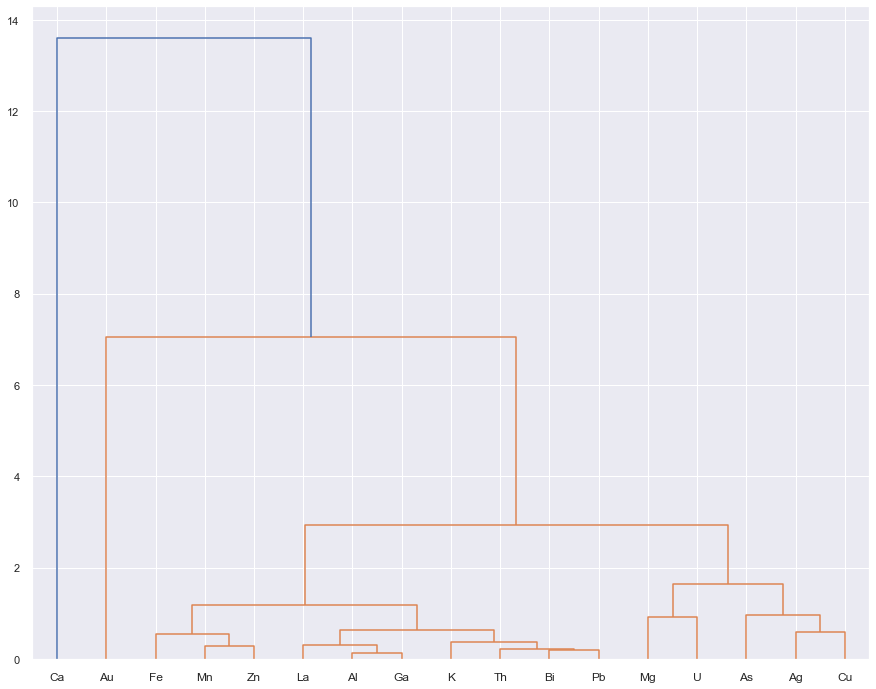

In [23]:
#Use the linkage() function to compute distance
Z = linkage(py_cov_mat, method='complete')

#Create a dendrogram
dn = dendrogram(Z, labels=list(py_cov_mat.index))

#Display the dendogram
plt.show()

Above we can see the clustering of elements of our dataset and how similar they are. Ca and Au are not similar to any other elements, which makes sense as the calcium value in the calcrete samples would vary over the survey area (likely that not all the samples were purely calcrete) and because gold is so sporadic. However, we can see that some of the elements have grouped together. If we had a larger suite of elements assayed (and if I was a better geochemist) it is possible that we could see groupings of mobile vs immobile elements, alteration pathfinder groupings or other groupings. For now we will group elements as seen in the dendrogram.

In [24]:
#Grouping the elements
ele_close['FeMnZn'] = ele_close['Fe'] + ele_close['Mn'] + ele_close['Zn']
ele_close['LaAlGa'] = ele_close['La'] + ele_close['Al'] + ele_close['Ga']
ele_close['KThBiPb'] = ele_close['K'] + ele_close['Th'] + ele_close['Bi'] + ele_close['Pb']
ele_close['MgU'] = ele_close['Mg'] + ele_close['U']
ele_close['AsAgCu'] = ele_close['As'] + ele_close['Ag'] + ele_close['Cu']

#Subsetting the element group
ele_close = ele_close[['Ca', 'Au', 'FeMnZn', 'LaAlGa', 'KThBiPb', 'MgU', 'AsAgCu']]

ele_close

,Ca,Au,FeMnZn,LaAlGa,KThBiPb,MgU,AsAgCu
0,3.840015,2.898125e-07,29.204404,52.708305,6.686075,7.536066,0.025134
1,52.676838,1.296851e-06,11.156621,20.763388,3.280365,12.104680,0.018107
2,3.900267,5.571810e-07,32.736770,49.222561,6.386201,7.722210,0.031990
3,2.841292,5.464022e-08,31.509924,54.345766,7.235240,4.044579,0.023200
4,3.605009,7.510435e-08,19.126825,71.682596,4.067284,1.503214,0.015073
...,...,...,...,...,...,...,...
1468,79.995144,3.106608e-07,6.351847,10.183549,1.401352,2.058516,0.009592
1469,61.504859,6.082898e-07,15.606013,18.328786,2.102642,2.434038,0.023662
1470,48.540909,2.286347e-06,5.076570,36.418582,2.643571,7.299867,0.020498
1471,69.918694,1.997677e-06,13.356726,11.545780,1.874962,3.287790,0.016046


#### Clustering
For clustering, we will apply another kind of transform to this data; the [Isometric Log Ratio](https://www.researchgate.net/publication/330134599_The_isometric_logratio_transformation_in_compositional_data_analysis_a_practical_evaluation). This will put our data once again into a euclidean space and a better (but more confusing) form for unsupervised learning.

In [25]:
# Applying ILR transform
ele_close_ilr = ilr(ele_close)

Now we will look at doing K-Means clustering again, and start by looking at the optimal number of clusters for our transformed data.

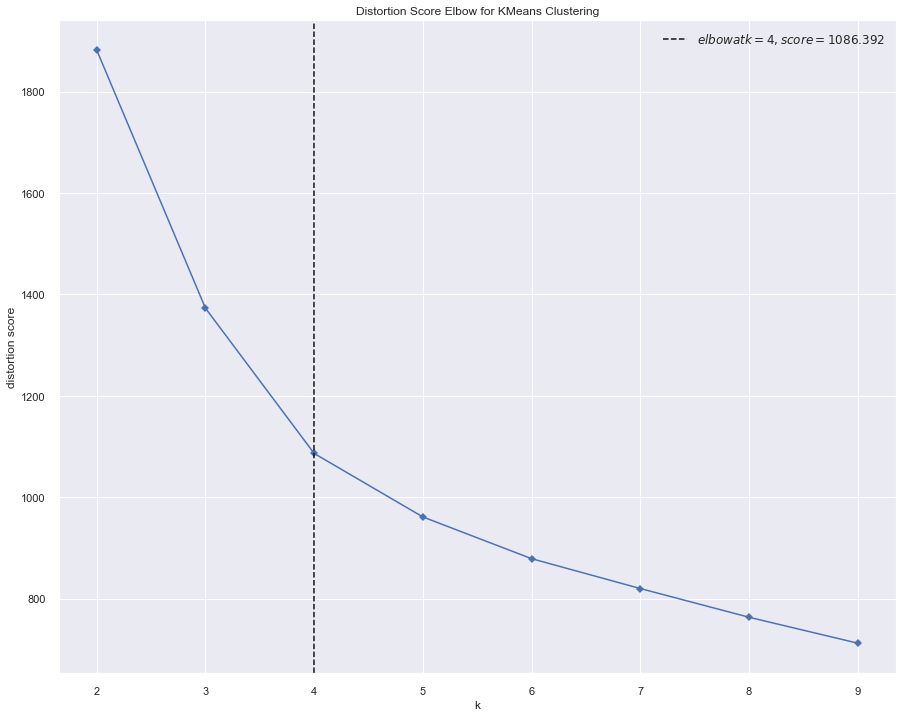

In [26]:
#Instantiate a scikit-learn K-Means model
model = KMeans(random_state=0)

#Instantiate the KElbowVisualizer with the number of clusters and the metric 
visualizer = KElbowVisualizer(model, k=(2,10), metric='distortion', timings=False)

#Fit the data and visualize
visualizer.fit(ele_close_ilr)    
visualizer.poof()   

Again, we can see that there are 4 clusters selected as the optimal amount of clusters. Next we will assess the silhouette scores of these clusters and compare them to our raw data.

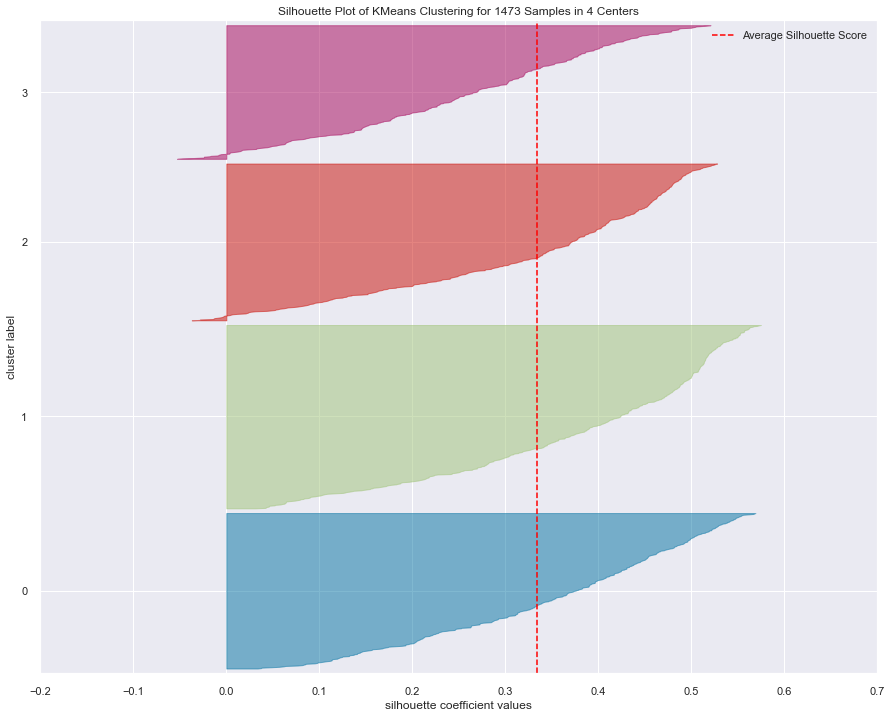

In [27]:
model = KMeans(4, random_state=0)

visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(ele_close_ilr) 
visualizer.show()  

The average silhouette score for the transformed data is approximately 0.33, as opposed to the silhouette score of the raw data which was 0.35. There is not much difference here in the scores, but we can see how the clusters looks by visualising it again in a ternary diagram. 

In [28]:
#Saving the cluster labels to our dataframes
ele_close['k_cluster_labels_ilr'] = model.labels_
df_p['k_cluster_labels_ilr'] = model.labels_

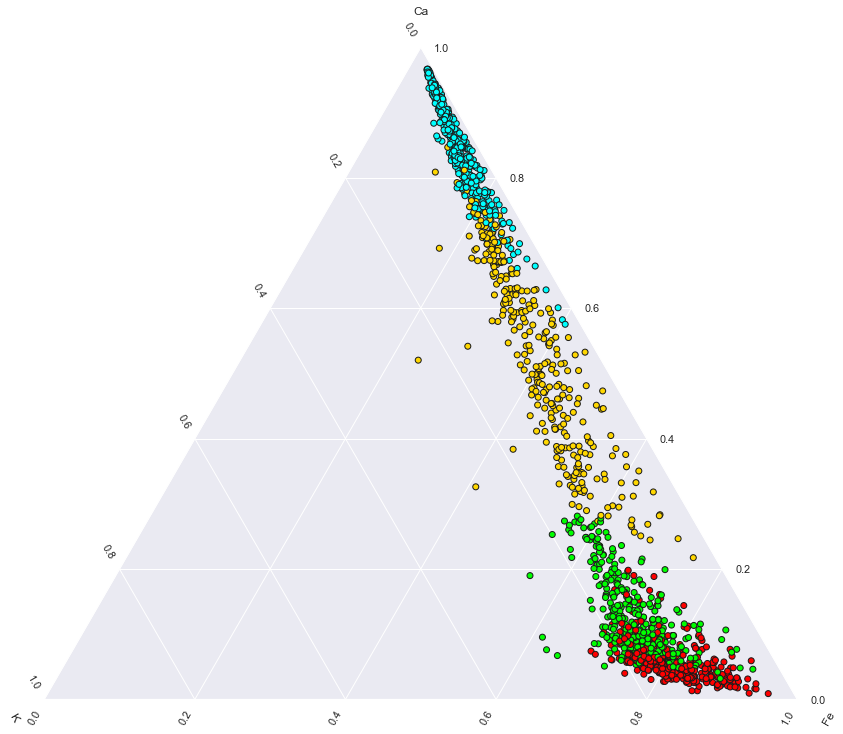

In [29]:
#Changing colour dictionary to match raw clusters
colors = {0: 'lime', 1:'cyan', 2:'red', 3:'gold'}

#Viewing the ternary diagram with transformed clusters
ax = df_p.loc[:, ["Ca", "K", "Fe"]].pyroplot.scatter(c=df_p['k_cluster_labels_ilr'].apply(lambda x: colors[x]), edgecolors='k')
plt.show()

We can see already that the transformed clustering has grouped the elements significantly better than the raw data, splitting the red and lime coloured clusters with a lot more confidence. Again, we can review the average values of each cluster and view the results spatially on a map.

In [30]:
#Viewing the average grouped values for each cluster
ele_close.groupby(['k_cluster_labels_ilr']).mean()

,Ca,Au,FeMnZn,LaAlGa,KThBiPb,MgU,AsAgCu
k_cluster_labels_ilr,,,,,,,
0,5.515626,8.751029e-07,32.272663,47.603593,6.740530,7.843077,0.024510
1,67.867510,1.669070e-06,9.735270,15.367117,1.953285,5.062052,0.014764
2,2.988956,2.304451e-07,41.053625,45.084772,6.683917,4.162506,0.026224
3,31.803173,1.144256e-06,23.254340,32.800143,4.562023,7.558214,0.022107


![Title](https://docs.google.com/uc?export=download&id=1ek0p1bwzgNDP-xw3oSzJTdHh-MbRiL6M)

![Title](https://docs.google.com/uc?export=download&id=1p5BpD5GEc9cKDrUw7mCZcLUN5bTaFXFE)

Here we can see that the clusters group together in a similar fashion to the raw data (second image for reference), but arguably show a better representation of the surficial features over the sampling grid. For example, the N-S trending creek bed in the South Eastern corner of the sampling grid is clearly defined as cluster 2 from the transformed clusters, whereas it is more difficult to interpret from the raw clusters. The high thorium areas from the radiometrics map are also highlighted with higher confidence, with group 1 samples bordering any high thorium areas. This is a good example of how performing a log transform on our data will return better distance based statistical results.

The main area of interest however, can be seen when we overlay our K-Nearest Neighbour model from __Gold Rush__.

![Title](https://docs.google.com/uc?export=download&id=1lzlmWYS55HwI-xdDwaZHqnM2M4coYscl)

When we remove the high Ca/low metal cluster, we can see a small trend of similar samples that follow the Middle Mesoproterozoic 'Bulgunnia Shear Zone'. This could be noise or it could be a surifical signature of a higher metal concentration from the shear zone in this region, surrounded by high Ca samples. The KNN model has predicted a high probability of mineralisation in this area and the second and final proposed drillhole, JM-GC2, has been located in this area because of that. 

This is the final notebook in the ExploreSA Gawler Challenge, thank you for reading and I hope some of the themes and workings in this series provide some inspiration and insight into the artificial intelligence side of exploration geology. Cheers, Jack. 